In [1]:
import io
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import plotly.express as px
warnings.filterwarnings('ignore')

%matplotlib inline

import polars as pl
from skimpy import skim
from summarytools import dfSummary
#summarytools doesnt work with polars library, it works with pandas tho

#%load_ext cudf.pandas
#supercharges workflow with GPU acceleration using cudf.pandas
#Im having pip install issues with cudf so commenting it out for now

## Final EDA?

In [2]:
fifa = pd.read_csv(r'C:\Users\admin\OneDrive\Documents\GitHub\Plotting\fifa_dataset_cleaned\fifa_training_2017_2022.csv')
#fifa.style.bar(cmap = "Blues", subset = "Value")
#fifa.style.bar(color = "blue", subset= "Value")
#pandas dataframe styling!!!
fifa.head(5)

,ID,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Special,...,Contract_Years_Remaining,Position_Group,Attacking_Composite,Passing_Composite,Defending_Composite,Physical_Composite,Technical_Composite,Pace_Composite,Int_Rep_Category,Market_Tier
0,176580,L. Suárez,29,Uruguay,92,92,FC Barcelona,83000000.0,525000.0,2291,...,4.0,Forward,89.000000,77.000000,37.666667,79.333333,87.666667,82.5,Worldwide,Superstar
1,178518,R. Nainggolan,28,Belgium,86,86,Roma,37500000.0,130000.0,2290,...,4.0,Other,82.000000,80.333333,83.666667,82.666667,79.333333,79.5,National,Star
2,181872,A. Vidal,29,Chile,87,87,FC Bayern München,41500000.0,180000.0,2285,...,2.0,Other,82.000000,82.000000,83.000000,84.666667,78.333333,75.5,Continental,Star
3,197445,D. Alaba,24,Austria,86,89,FC Bayern München,41500000.0,140000.0,2279,...,4.0,Defender,76.333333,80.333333,82.333333,79.333333,80.000000,86.0,Continental,Star
4,195864,P. Pogba,23,France,88,94,Manchester United,71500000.0,225000.0,2271,...,4.0,Other,82.666667,86.666667,71.333333,89.000000,87.666667,77.0,Continental,Superstar


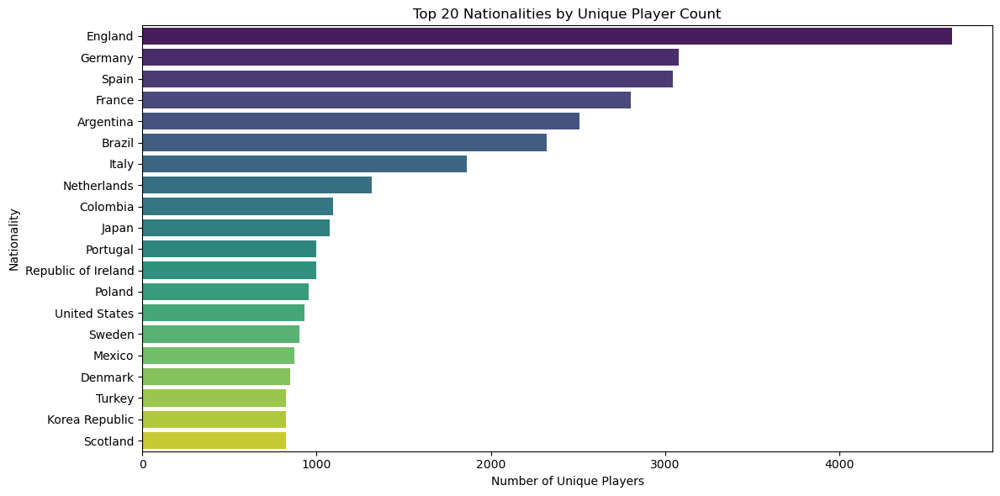

In [3]:
# Nationality of Players Plot for Unique Players
unique_players = fifa.drop_duplicates(subset=['Name'])
nationality_counts = unique_players['Nationality'].value_counts().head(20)

plt.figure(figsize=(12,6))
sns.barplot(x=nationality_counts.values, y=nationality_counts.index, palette='viridis')
plt.title('Top 20 Nationalities by Unique Player Count')
plt.xlabel('Number of Unique Players')
plt.ylabel('Nationality')
plt.tight_layout()
plt.show()
#This graph suggests that England has the most number of fifa players!!!


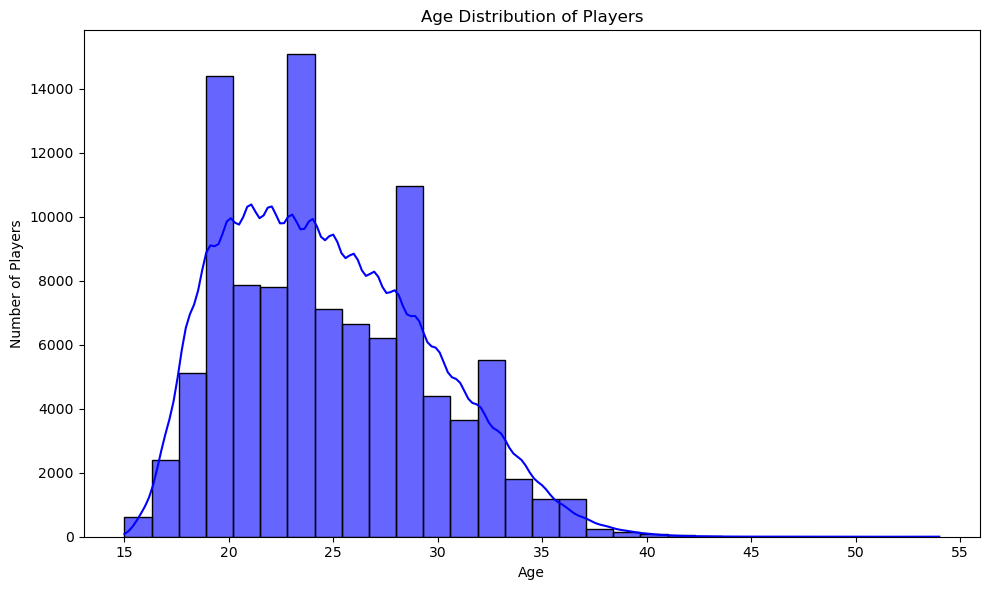

In [4]:
# Age of Players Plotted
plt.figure(figsize=(10,6))
sns.histplot(fifa['Age'], bins=30, kde=True, color='blue', alpha=0.6, edgecolor='black', linewidth=1)
plt.title('Age Distribution of Players')
plt.xlabel('Age')
plt.ylabel('Number of Players')
plt.tight_layout()
plt.show()
#This graph shows us how old players were when they played from 2017-2023

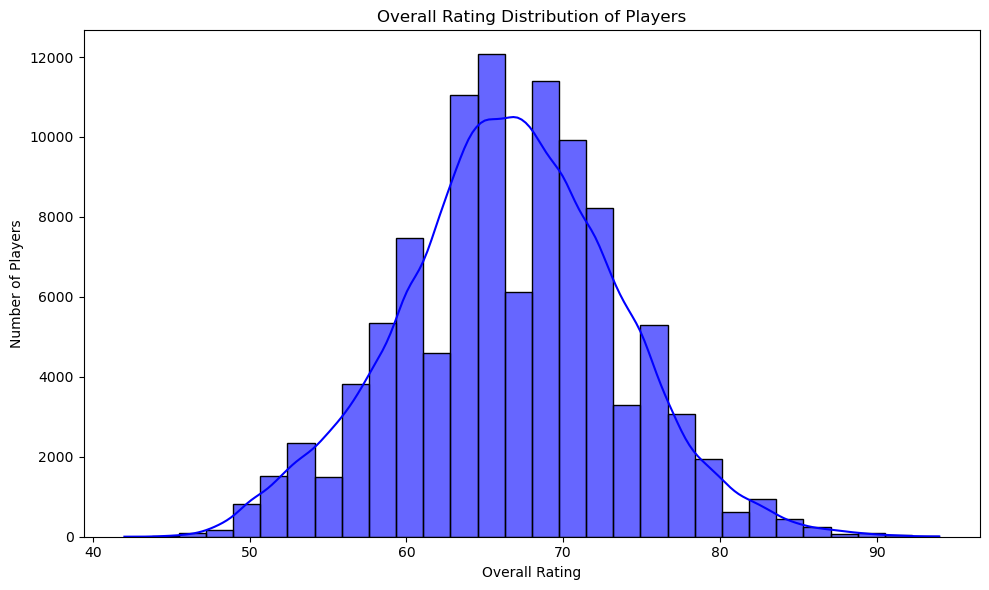

In [5]:
# Distribution of Overall Ratings
plt.figure(figsize=(10,6))
sns.histplot(fifa['Overall'], bins=30, kde=True, color='blue', alpha=0.6, edgecolor='black', linewidth=1)
plt.title('Overall Rating Distribution of Players')
plt.xlabel('Overall Rating')
plt.ylabel('Number of Players')
plt.tight_layout()
plt.show()

#This graph shows the distribution of player overall ratings in the FIFA dataset.
#The histogram displays the frequency of players at different overall rating intervals, while the KDE curve provides a smoothed estimate of the overall rating distribution. 
#This visualization helps to understand the overall rating demographics of players in the dataset, highlighting common overall rating ranges and potential outliers.

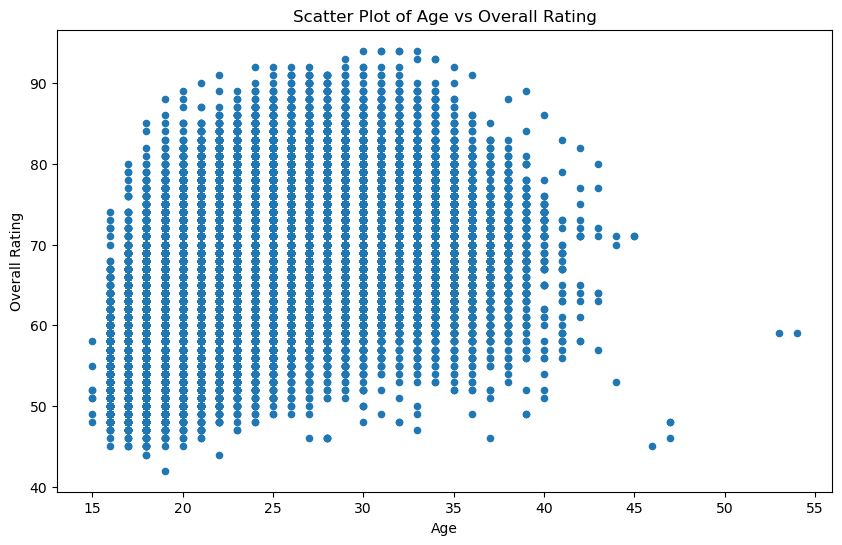

In [6]:
#Age vs Overall
fifa.plot(kind = "scatter", x = "Age", y = "Overall", cmap = "Blues", figsize = (10,6))
plt.title('Scatter Plot of Age vs Overall Rating')
plt.xlabel('Age')
plt.ylabel('Overall Rating')
plt.show()
#The graph shows being in your 20-25s and having overall rating of 60-70 is the most common

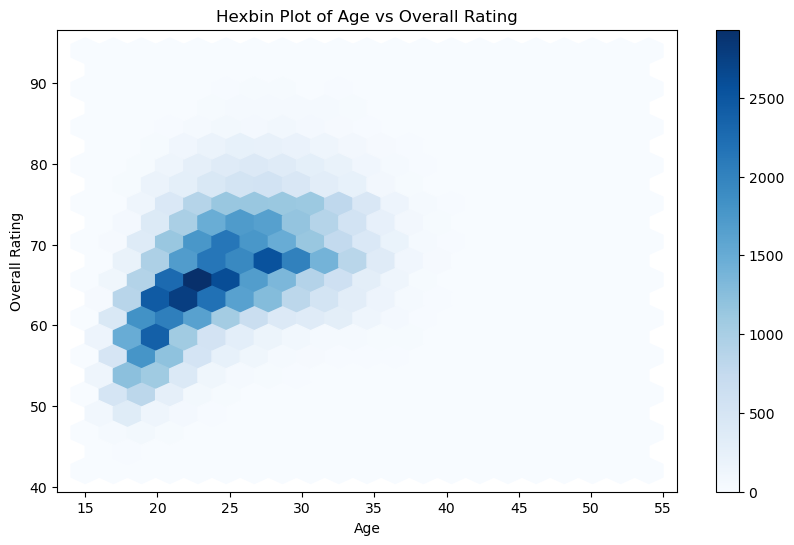

In [7]:
#Age vs Overall
fifa.plot(kind = "hexbin", x = "Age", y = "Overall", gridsize = 20, cmap = "Blues", figsize = (10,6))
plt.title('Hexbin Plot of Age vs Overall Rating')
plt.xlabel('Age')
plt.ylabel('Overall Rating')
plt.show()
#The graph shows being in your 20-25s and having overall rating of 60-70 is the most common
#Better plot than scatter plot as it shows more density and its intensity by colour

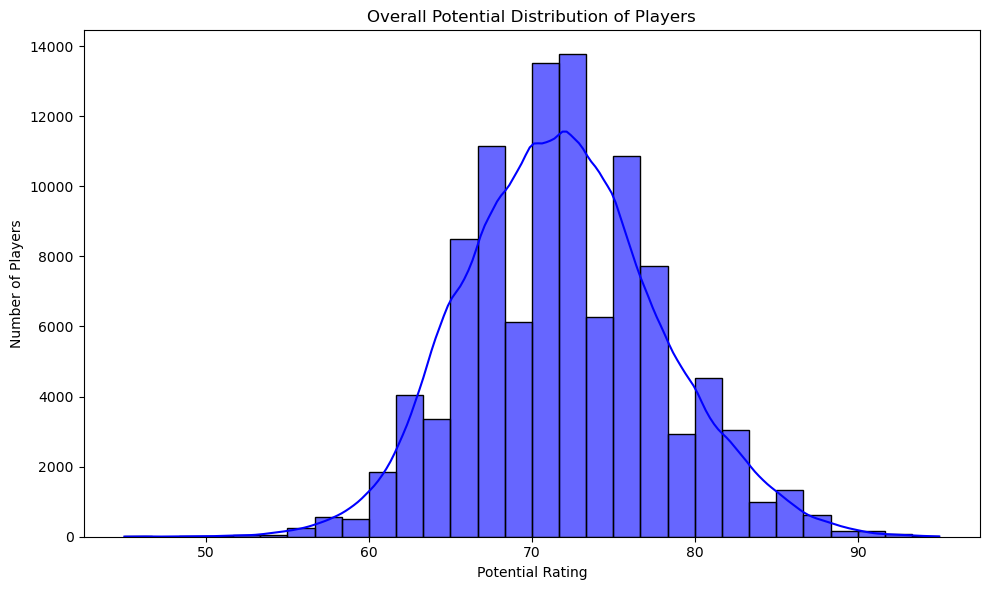

In [8]:
#Start with Potential Column

plt.figure(figsize=(10,6))
sns.histplot(fifa['Potential'], bins=30, kde=True, color='blue', alpha=0.6, edgecolor='black', linewidth=1)
plt.title('Overall Potential Distribution of Players')
plt.xlabel('Potential Rating')
plt.ylabel('Number of Players')
plt.tight_layout()
plt.show()

#This graph shows a slightly left skewed data for the potential column

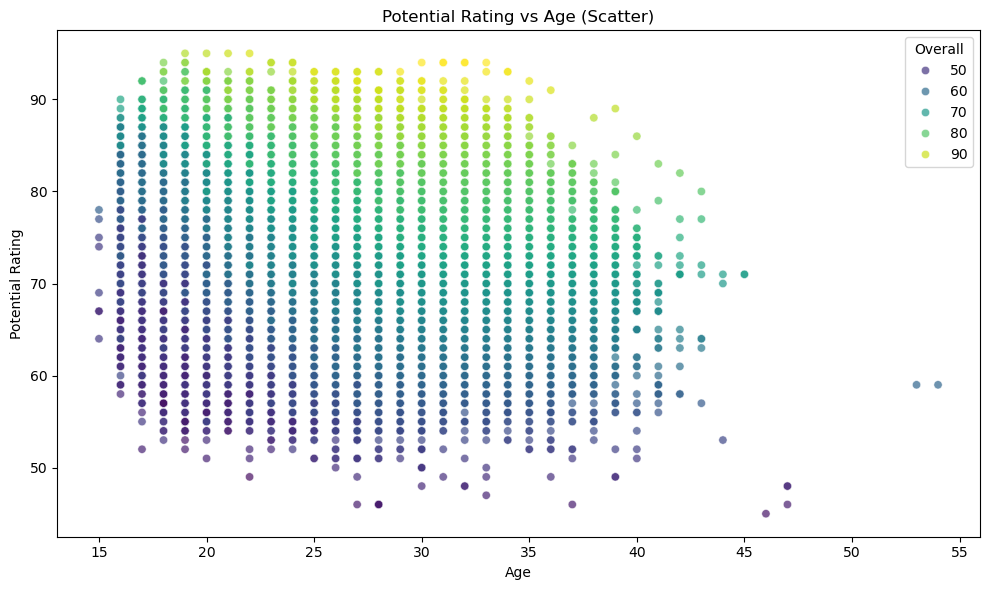

In [9]:
#Potential Rating vs Age
plt.figure(figsize=(10,6))
sns.scatterplot(data=fifa, x='Age', y='Potential', hue='Overall', palette='viridis', alpha=0.7)
plt.title('Potential Rating vs Age (Scatter)')    
plt.xlabel('Age')
plt.ylabel('Potential Rating')
plt.tight_layout()
plt.show()
#This graph shows exactly what it says, potential vs age

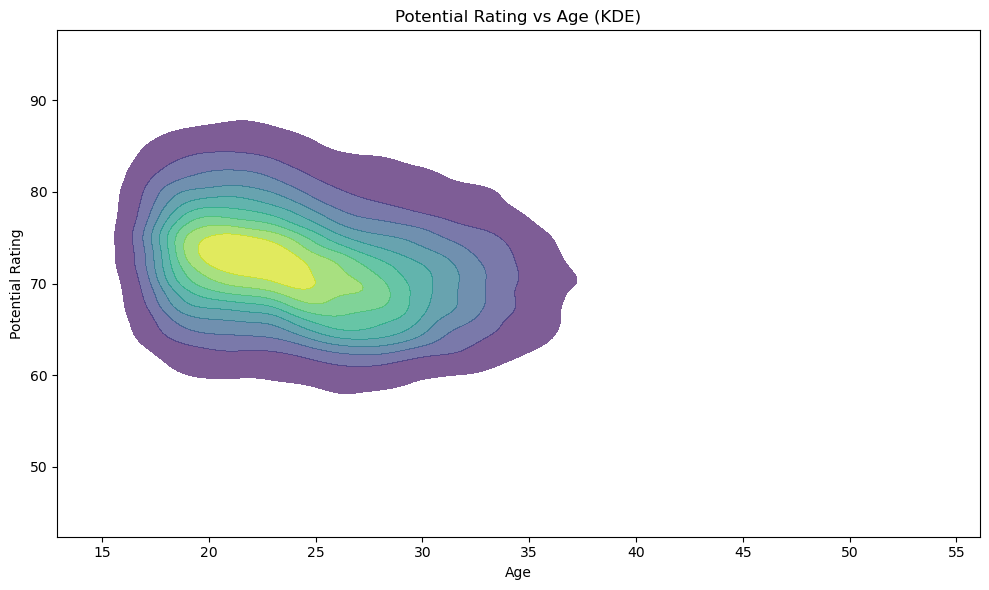

In [10]:
#Potential Rating vs Age
plt.figure(figsize=(10,6))
sns.kdeplot(data=fifa, x='Age', y='Potential', cmap='viridis', fill=True, alpha=0.7)
plt.title('Potential Rating vs Age (KDE)')
plt.xlabel('Age')
plt.ylabel('Potential Rating')
plt.tight_layout()
plt.show()
#This graph shows exactly what it says, potential vs age
#Alt of scatter plot, better visualization of density

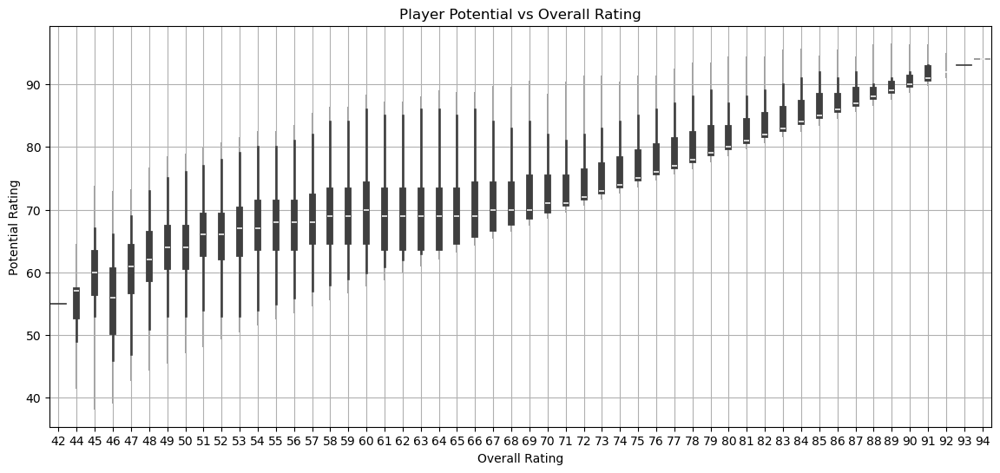

In [11]:
#Potential vs Overall
plt.figure(figsize=(14,6))
sns.violinplot(data=fifa, x='Overall', y='Potential', alpha=0.5)
plt.title('Player Potential vs Overall Rating')
plt.xlabel('Overall Rating')
plt.ylabel('Potential Rating')
plt.grid(True)
plt.show()

#Violin plot shows distribution, density and probability of a numeriv value for differnet categories
#combines boxplot and KDE to show shape

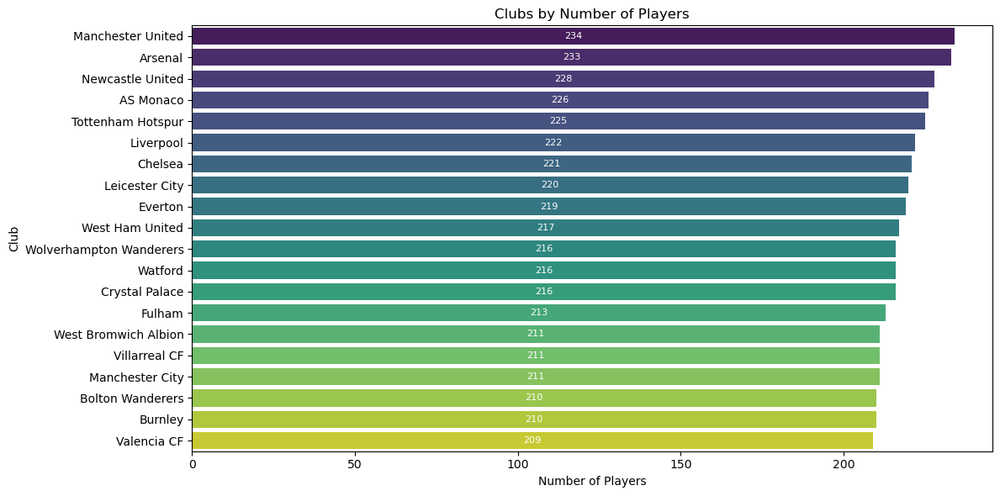

In [12]:
#Graph to show number of players per club
plt.figure(figsize=(12,6))
club_counts = fifa['Club'].value_counts().head(20)
ax = sns.barplot(x=club_counts.values, y=club_counts.index, palette='viridis')
plt.title('Clubs by Number of Players')
plt.xlabel('Number of Players')
plt.ylabel('Club')
plt.tight_layout()
for container in ax.containers:
    ax.bar_label(container, label_type="center", color="white", fontsize=8)
plt.show()
#This graph shows the top 20 clubs with the most players in the fifa dataset
#Manchester City has the most players in the dataset

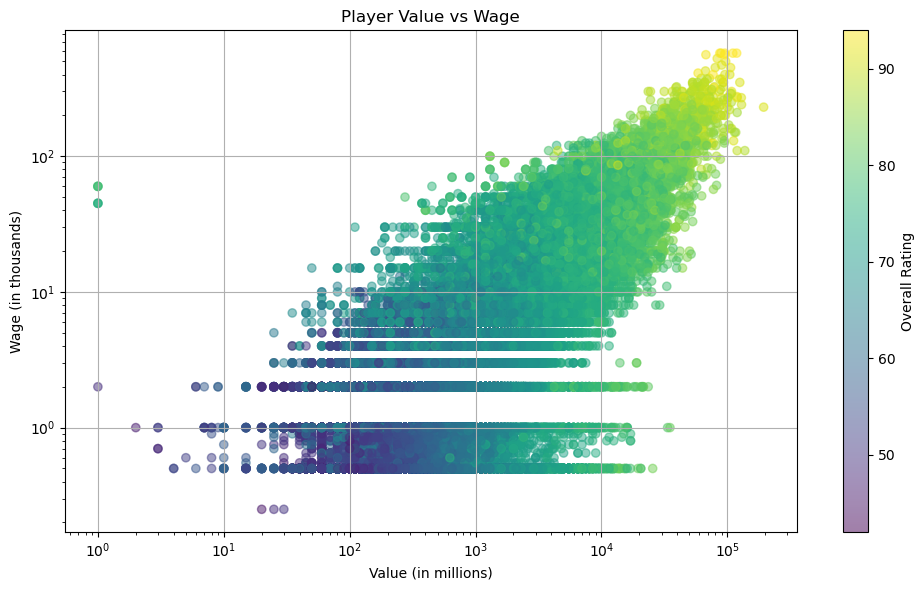

In [13]:
#Graph showing values and wages of players
plt.figure(figsize=(10,6))
plt.scatter(fifa['Value']/1000, fifa['Wage']/1000, alpha=0.5, c=fifa['Overall'], cmap='viridis')
plt.xscale('log')
plt.yscale('log')
plt.colorbar(label='Overall Rating')
plt.title('Player Value vs Wage')
plt.xlabel('Value (in millions)')
plt.ylabel('Wage (in thousands)')
plt.grid(True)
plt.tight_layout()
plt.show()

# Graph shows 

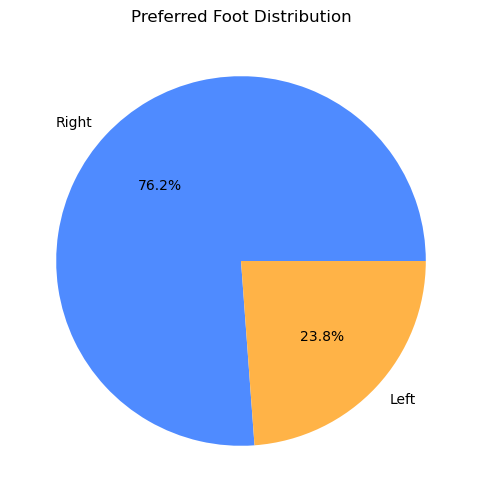

In [14]:
#Graph Preferred Foot, Left or Right?
foot_counts = fifa['Preferred Foot'].value_counts()
plt.figure(figsize=(6,6))
plt.pie(foot_counts, labels=foot_counts.index, autopct='%1.1f%%', colors=['#4f8bff', '#ffb347'])
plt.title('Preferred Foot Distribution')
plt.show()

#Graph Preferred Foot, Left or Right? shows 76.2% Right Footed Players and 23.8% Left Footed Players

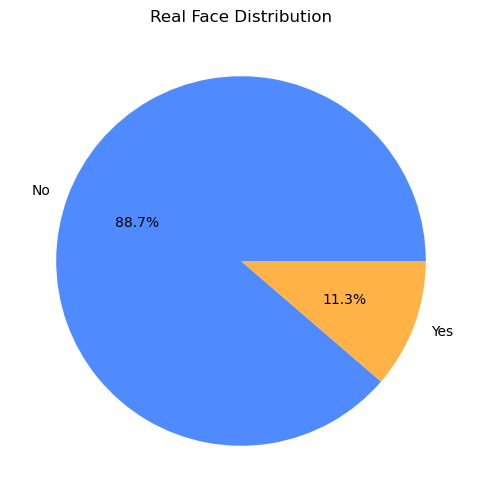

In [15]:
#Graph to show which players have real faces in the game or they have used a generic face model

real_face_counts = fifa['Real Face'].value_counts()
plt.figure(figsize=(6,6))
plt.pie(real_face_counts, labels=real_face_counts.index, autopct='%1.1f%%', colors=['#4f8bff', '#ffb347'])
plt.title('Real Face Distribution')
plt.show()


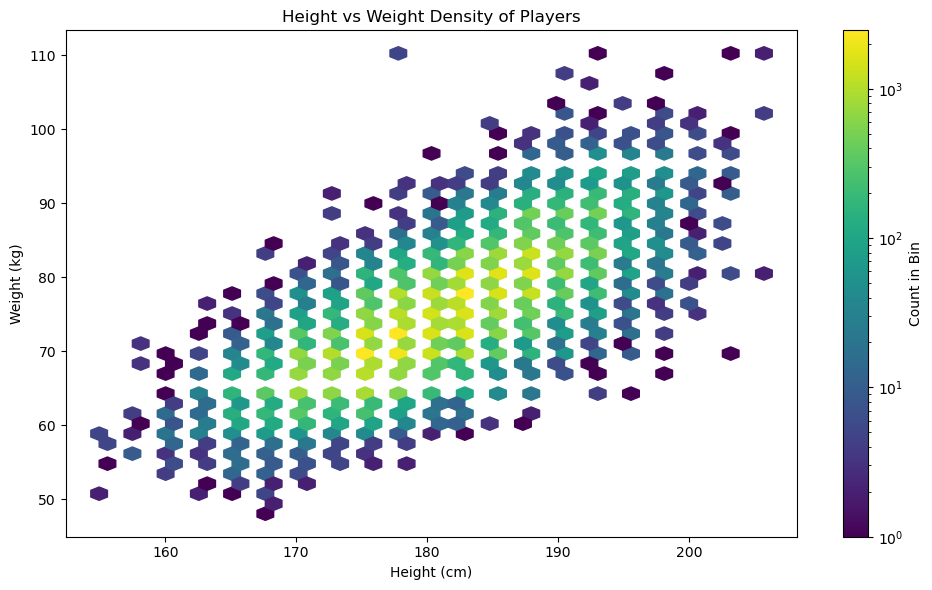

In [16]:
#Hexbin plot of Height vs Weight

plt.figure(figsize=(10,6))
plt.hexbin(fifa['Height'], fifa['Weight'], gridsize=40, cmap='viridis', bins='log')
plt.title('Height vs Weight Density of Players')
plt.xlabel('Height (cm)')
plt.ylabel('Weight (kg)')
plt.colorbar(label='Count in Bin')
plt.tight_layout()
plt.show()

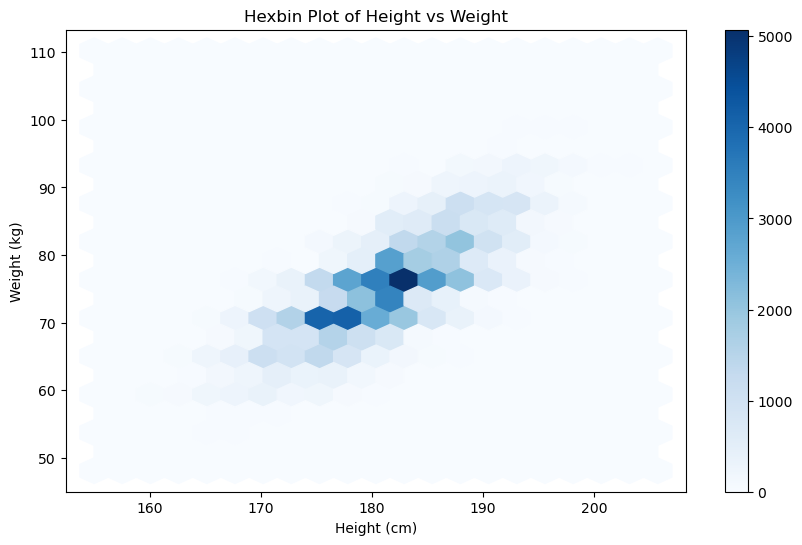

In [17]:
#Another hexbin plot for height vs weight
    
fifa.plot(kind = "hexbin", x = "Height", y = "Weight", gridsize = 20, cmap = "Blues", figsize = (10,6))
plt.title('Hexbin Plot of Height vs Weight')
plt.xlabel('Height (cm)')
plt.ylabel('Weight (kg)')
plt.show()

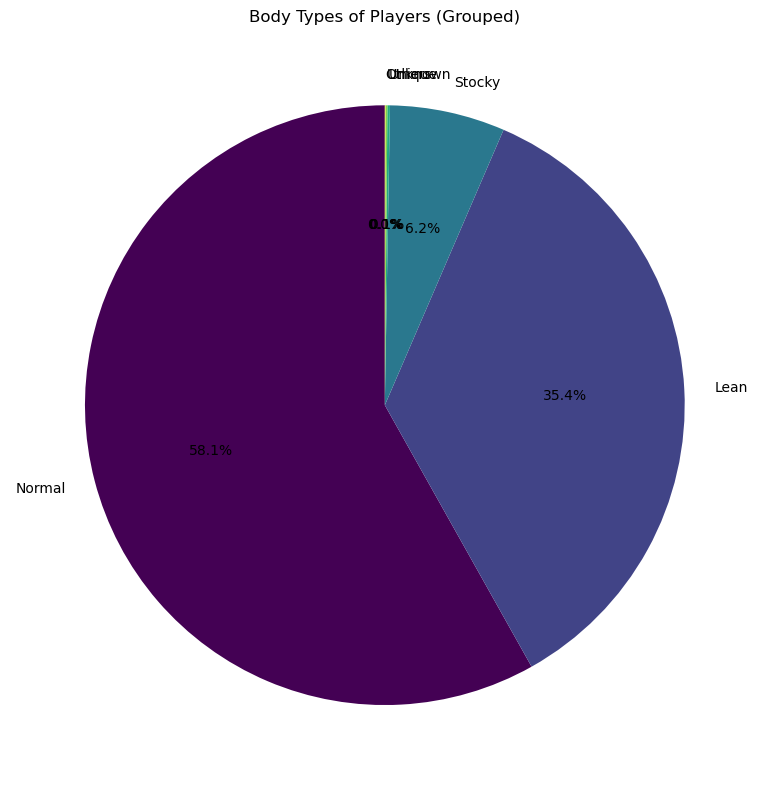

In [18]:
#Graph to show body types of players in the dataset using a pie chart, grouping rare types as 'Others'
body_type_series = fifa['Body Type Clean'].copy()
common_types = body_type_series.value_counts().nlargest(5).index
body_type_series = body_type_series.apply(lambda x: x if x in common_types else 'Others')
body_type_counts = body_type_series.value_counts()
plt.figure(figsize=(8,8))
plt.pie(body_type_counts, labels=body_type_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.viridis(np.linspace(0, 1, len(body_type_counts))))
plt.title('Body Types of Players (Grouped)')
plt.tight_layout()  
plt.show()

#Shows percentage with most common body types and groups rare ones as 'Others'

In [19]:
#Number of players who were given loan by clubs
loan_counts = fifa['Loaned From_clean'].value_counts()
loan_status = ['On Loan' if x != 'No' else 'Not on Loan' for x in fifa['Loaned From_clean']]
print(f"Players on Loan: {loan_counts[loan_counts.index != 'No'].sum()}")
print(f"Players Not on Loan: {loan_counts.get('No', 0)}")

Players on Loan: 7843
Players Not on Loan: 0


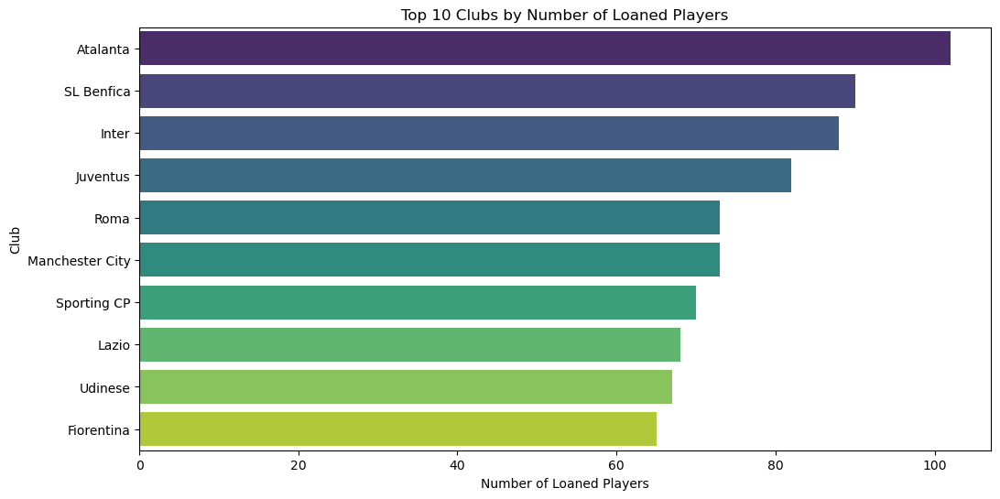

In [20]:
#Plot top 10 clubs that have loaned players
loaned_players = fifa[fifa['Loaned From_clean'] != 'No']    
top_loan_clubs = loaned_players['Loaned From_clean'].value_counts().head(10)
plt.figure(figsize=(12,6))
sns.barplot(x=top_loan_clubs.values, y=top_loan_clubs.index, palette='viridis')
plt.title('Top 10 Clubs by Number of Loaned Players')
plt.xlabel('Number of Loaned Players')
plt.ylabel('Club')
plt.show()

#Shows Atlanta United has loaned the most players in the dataset

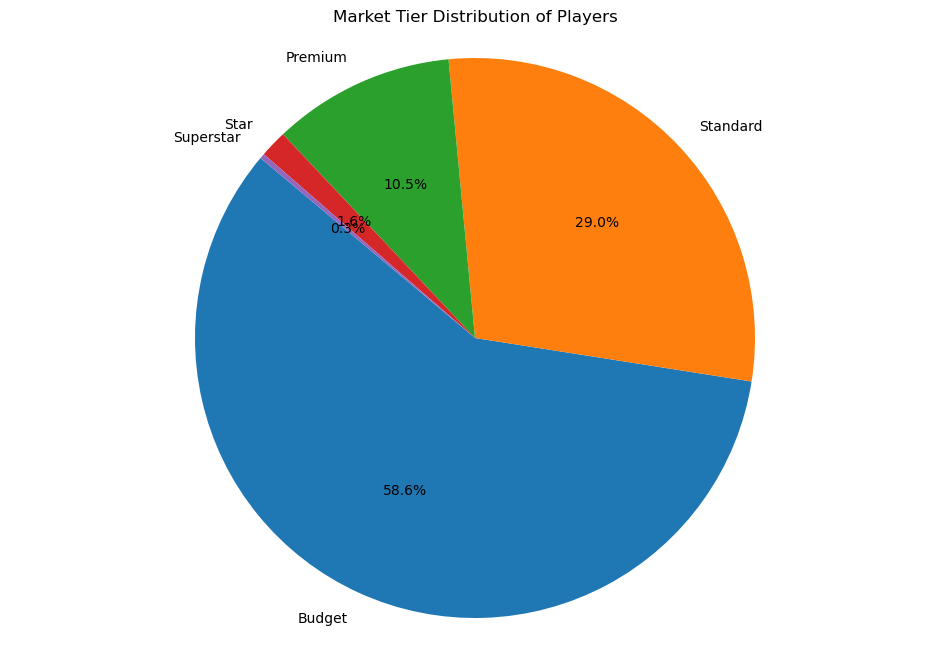

In [21]:
#Market Tier of players based on their club's league plotted using pie chart
market_tier_counts = fifa['Market_Tier'].value_counts()
plt.figure(figsize=(12,8))
plt.pie(market_tier_counts, labels=market_tier_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Market Tier Distribution of Players')
plt.axis('equal')
plt.show()

#Shows percentage of players in different market tiers, with most players in Average category

## **Use the Training Dataset (fifa_training_2017_2022.csv) for EDA**

Use `fifa_training_2017_2022.csv` because:
- ✅ **Full feature set** (60+ attributes vs 27 in FIFA 2023)
- ✅ **6 years of data** (2017-2022) for trend analysis
- ✅ **102,496 samples** for robust statistical analysis
- ✅ **All skill attributes** for detailed player analysis

---

## **Comprehensive EDA Plan for FIFA Wage Prediction**

### **🎯 Phase 1: Target Variable Analysis**
```python
# Wage distribution and outliers
- Histogram of wages by position
- Box plots: wages by position group
- Log transformation analysis
- Outlier detection (players with extreme wages)
- Wage trends over years (2017-2022)
```

### **📊 Phase 2: Feature Distributions & Correlations**
```python
# Primary predictors
- Overall rating distribution by position
- Age distribution and career curves
- Value vs Wage correlation
- Position-wise salary ranges
- Nationality impact on wages

# Correlation heatmap: all numerical features vs wage
- Top 15 features most correlated with wage
- Feature correlation matrix (avoid multicollinearity)
```

### **🏆 Phase 3: Player Performance Analysis**
```python
# Rating analysis
- Overall vs Potential gap analysis
- Age curves by position (when do players peak?)
- Skill attribute radar charts by position
- Elite players analysis (90+ rating)

# Position-specific analysis
- Goalkeeper: GK-specific attributes vs wage
- Defenders: Defending composite vs wage  
- Midfielders: Passing composite vs wage
- Forwards: Attacking composite vs wage
```

### **💰 Phase 4: Market Value & Economics**
```python
# Value vs Wage relationship
- Scatter plot: Value vs Wage (identify undervalued/overvalued)
- Market tier distribution
- Value appreciation by age
- Transfer market analysis

# Contract analysis  
- Contract years remaining vs wage
- Age vs contract length patterns
```

### **🌍 Phase 5: Geographic & Club Analysis**
```python
# Nationality analysis
- Top 20 countries by average wage
- Premium leagues vs player wages
- Geographic wage distribution map
- Export/import of talent analysis

# Club analysis
- Highest paying clubs
- Club budget tiers
- Squad composition analysis
- Wage bill distribution
```

### **⏰ Phase 6: Temporal Analysis (2017-2022)**
```python
# Market trends
- Wage inflation over 6 years
- Position-wise wage growth
- Age premium changes over time
- Market bubble analysis

# Player development
- Young talent wage progression
- Veteran player wage decline
- Peak performance age by position
```

### **🔍 Phase 7: Advanced Pattern Recognition**
```python
# Player clustering
- K-means clustering by attributes
- Similar player profiles
- Position versatility analysis
- Playing style archetypes

# Anomaly detection
- Overpaid/underpaid players
- Hidden gems (low wage, high performance)
- Declining stars (high wage, low performance)
```

### **⚖️ Phase 8: Feature Importance for ML**
```python
# ML preparation insights
- Feature importance ranking
- Missing value patterns
- Categorical variable cardinality
- Feature engineering validation

# Model preprocessing insights
- Skewness analysis (need transformations?)
- Outlier impact assessment
- Feature scaling requirements
```

---

## **Key EDA Questions to Answer:**

### **💡 Business Questions:**
1. What drives player wages the most?
2. Which positions are highest paid?
3. At what age do players earn peak wages?
4. Which nationalities command premium wages?
5. How has the transfer market inflated over 6 years?

### **🔬 ML Model Questions:**
1. Which features are most predictive of wage?
2. Are there non-linear relationships to capture?
3. Which categorical variables need encoding?
4. What's the optimal train/validation split strategy?
5. Are there interaction effects between features?

### **🎨 Visualization Priorities:**
1. **Interactive dashboards** for player comparisons
2. **Geographic maps** showing wage distributions
3. **Time series** showing market evolution
4. **Correlation matrices** for feature relationships
5. **Box plots** for position-wise analysis

---

## **Recommended EDA Tools:**
- **Pandas Profiling**: Quick overview
- **Plotly/Seaborn**: Interactive visualizations  
- **Matplotlib**: Statistical plots
- **Folium**: Geographic analysis
- **Plotly Dash**: Interactive dashboards

**Would you like me to create specific EDA code for any of these analysis areas?** I can build interactive visualization tools tailored to your FIFA wage prediction goal!

Dataset loaded: 102,496 players, 80 features
Years: [np.int64(2017), np.int64(2018), np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022)]
🚀 STARTING COMPREHENSIVE FIFA WAGE PREDICTION EDA
PHASE 1: DATASET OVERVIEW & TARGET ANALYSIS



WAGE STATISTICS:
Mean: €2663K
Median: €2000K
Std: €2789K
Range: €11K - €10000K

PHASE 2: CORRELATION ANALYSIS
TOP 15 FEATURES CORRELATED WITH WAGE:
Wage_Clean                  1.000000
Wage                        0.215855
Value                       0.188779
Value_Clean                 0.188779
International Reputation    0.175428
Potential_Ratio             0.125099
Potential_Gap               0.114308
Contract_Year_Clean         0.107848
Defending_Composite         0.102312
Year                        0.096522
Age                         0.093761
Potential                   0.079108
ID                          0.072044
Physical_Composite          0.051725
Strength                    0.044641
Name: Wage_Clean, dtype: float64


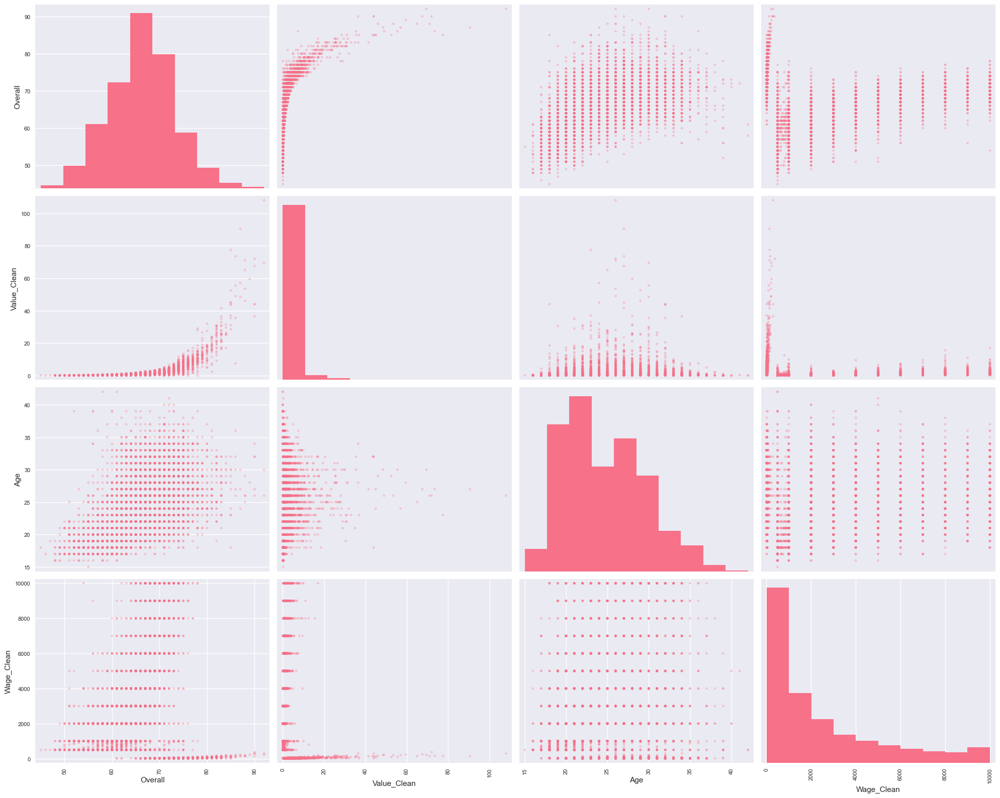


PHASE 3: POSITION ANALYSIS


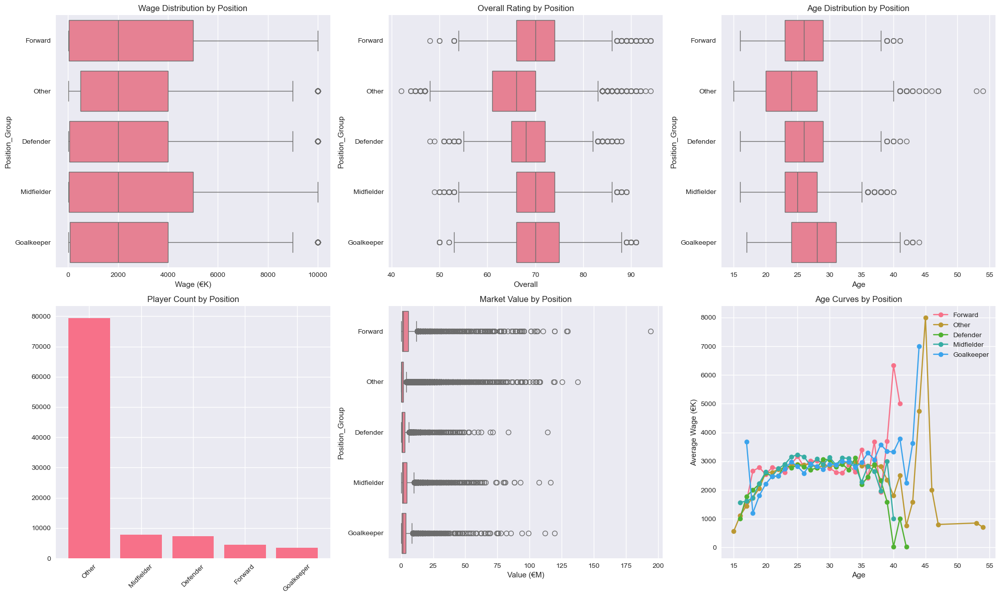


POSITION WAGE STATISTICS:
                count    mean  median     std
Position_Group                               
Defender         7347  2745.8  2000.0  2877.0
Forward          4418  2836.2  2000.0  3142.3
Goalkeeper       3495  2799.2  2000.0  2927.1
Midfielder       7846  2896.0  2000.0  3107.9
Other           79390  2616.8  2000.0  2718.2

PHASE 4: TEMPORAL ANALYSIS (2017-2022)


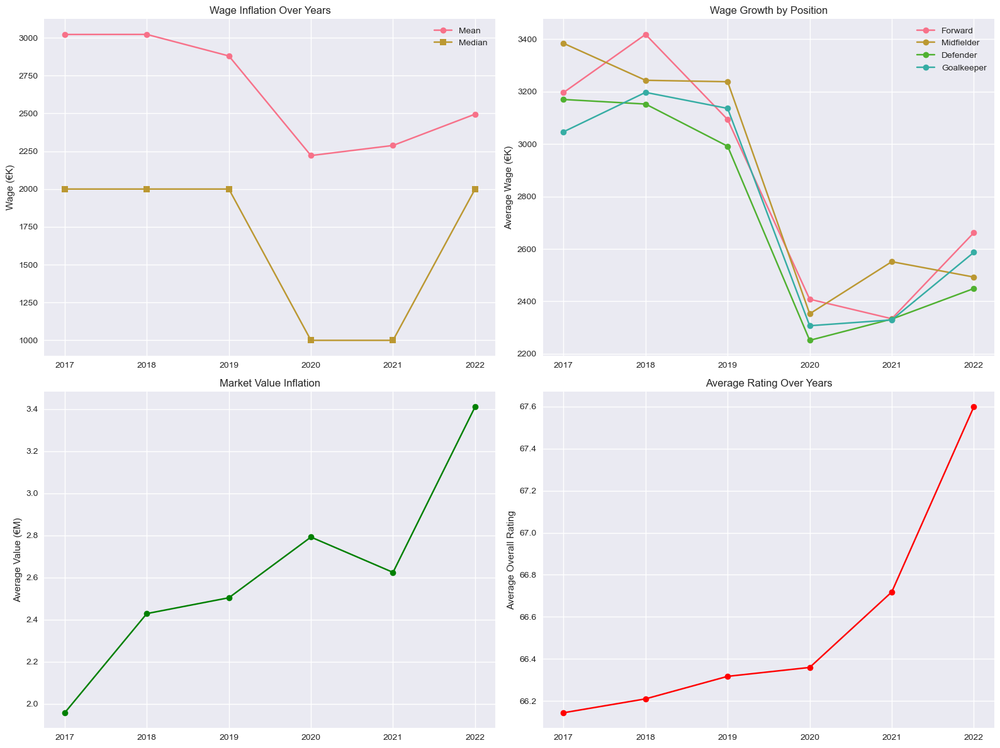


TEMPORAL INSIGHTS:
Annual wage growth rate: -3.8%
Annual value growth rate: 11.7%

PHASE 5: GEOGRAPHIC ANALYSIS


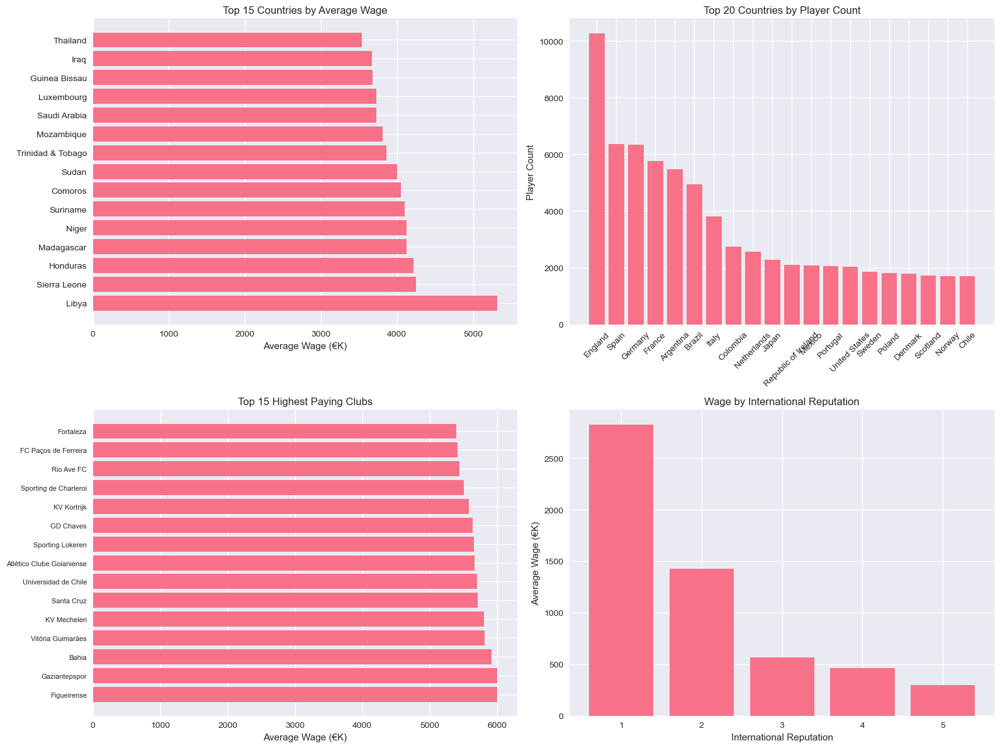


GEOGRAPHIC INSIGHTS:
Total countries represented: 190
Average wage premium for top 5 countries: 4407€K

PHASE 6: ADVANCED PATTERNS


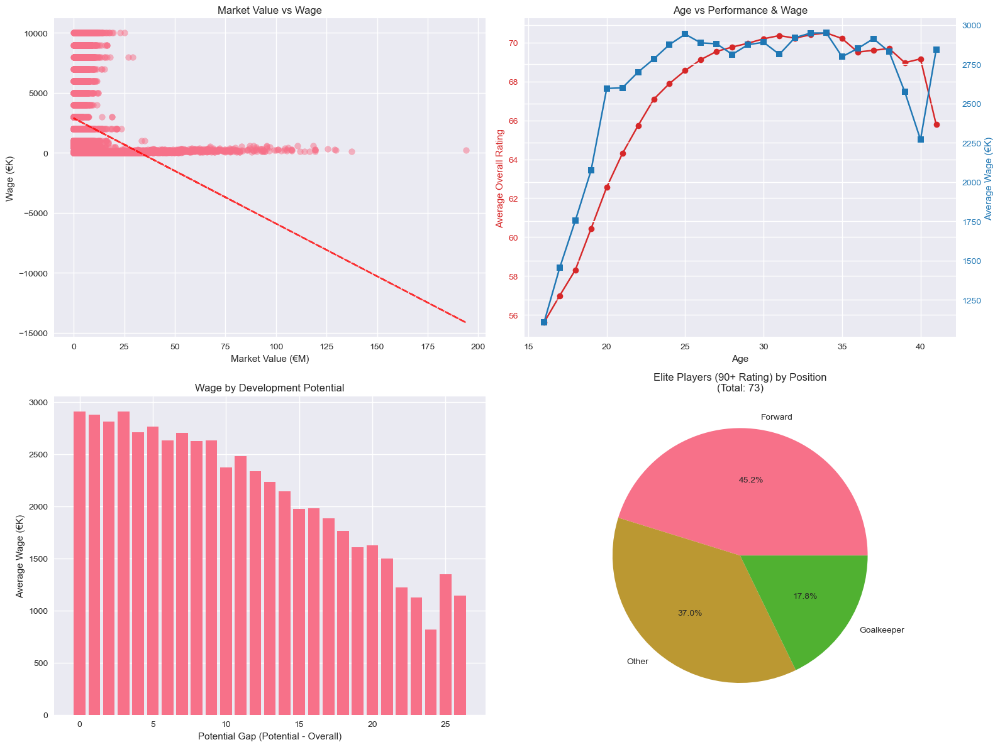


INTERESTING FINDINGS:

TOP 10 UNDERVALUED PLAYERS (High Performance, Low Wage):
          Name  Age  Overall  Wage_Clean Position_Group
       Iniesta   35       82        11.0          Other
      C. Pavón   23       79        11.0     Midfielder
      C. Pavón   24       79        11.0     Midfielder
      Quaresma   36       79        11.0          Other
    B. Matuidi   34       79        11.0          Other
  21 A. Robben   36       79        11.0          Other
 J. dos Santos   29       78        11.0          Other
      Y. Chará   28       78        11.0     Midfielder
     P. Piatti   30       78        11.0     Midfielder
      M. Bizot   28       78        11.0     Goalkeeper

PHASE 7: ML PREPARATION INSIGHTS


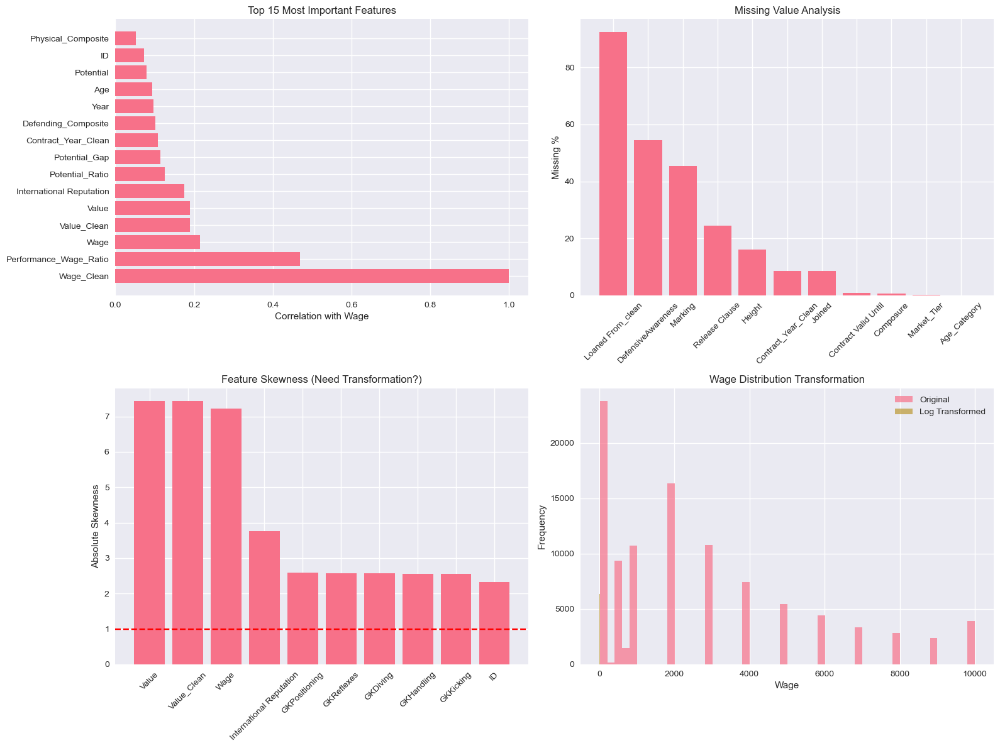


ML PREPARATION INSIGHTS:
Dataset size: 102,496 samples, 81 features
Target variable (Wage) skewness: 1.14
Highly skewed features (>1): 10
Features with >10% missing: 5

CATEGORICAL FEATURES:
  Name: 49736 unique values
  Nationality: 190 unique values
  Club: 1122 unique values
  Preferred Foot: 2 unique values
  Real Face: 2 unique values
  Joined: 3294 unique values
  Contract Valid Until: 124 unique values
  Best Position: 15 unique values
  Position_clean: 29 unique values
  Body Type Clean: 13 unique values

🎉 EDA COMPLETE! Key Takeaways:
✅ Target variable analyzed and transformation needs identified
✅ Feature importance ranking completed
✅ Position and temporal patterns discovered
✅ Geographic and market insights extracted
✅ Advanced patterns and outliers identified
✅ ML preprocessing requirements determined

🔥 Ready for ML model building!


In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore')

# Set style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

class FIFAWageEDA:
    def __init__(self, data_path='fifa_training_2017_2022.csv'):
        """Initialize FIFA EDA class"""
        self.df = pd.read_csv(data_path)
        self.setup_data()
        print(f"Dataset loaded: {self.df.shape[0]:,} players, {self.df.shape[1]} features")
        print(f"Years: {sorted(self.df['Year'].unique())}")
        
    def setup_data(self):
        """Setup data types and basic preprocessing"""
        # Ensure numeric columns
        numeric_cols = ['Wage_Clean', 'Value_Clean', 'Overall', 'Age', 'Potential']
        for col in numeric_cols:
            if col in self.df.columns:
                self.df[col] = pd.to_numeric(self.df[col], errors='coerce')
                
        # Remove extreme outliers for better visualization
        self.df = self.df[self.df['Wage_Clean'] <= self.df['Wage_Clean'].quantile(0.99)]
        
    def overview_analysis(self):
        """Phase 1: Dataset Overview and Target Variable Analysis"""
        print("="*60)
        print("PHASE 1: DATASET OVERVIEW & TARGET ANALYSIS")
        print("="*60)
        
        fig = make_subplots(
            rows=2, cols=3,
            subplot_titles=('Wage Distribution', 'Log Wage Distribution', 'Wages by Position',
                          'Wage Trends Over Years', 'Age vs Wage', 'Overall vs Wage'),
            specs=[[{"secondary_y": False}, {"secondary_y": False}, {"secondary_y": False}],
                   [{"secondary_y": False}, {"secondary_y": False}, {"secondary_y": False}]]
        )
        
        # 1. Wage Distribution
        fig.add_trace(go.Histogram(x=self.df['Wage_Clean'], nbinsx=50, name='Wage Distribution'),
                     row=1, col=1)
        
        # 2. Log Wage Distribution
        fig.add_trace(go.Histogram(x=np.log1p(self.df['Wage_Clean']), nbinsx=50, name='Log Wage'),
                     row=1, col=2)
        
        # 3. Wages by Position
        position_wages = self.df.groupby('Position_Group')['Wage_Clean'].mean().sort_values(ascending=True)
        fig.add_trace(go.Bar(x=position_wages.values, y=position_wages.index, 
                           orientation='h', name='Avg Wage by Position'),
                     row=1, col=3)
        
        # 4. Wage trends over years
        yearly_wages = self.df.groupby('Year')['Wage_Clean'].mean()
        fig.add_trace(go.Scatter(x=yearly_wages.index, y=yearly_wages.values, 
                               mode='lines+markers', name='Yearly Trend'),
                     row=2, col=1)
        
        # 5. Age vs Wage
        fig.add_trace(go.Scatter(x=self.df['Age'], y=self.df['Wage_Clean'], 
                               mode='markers', opacity=0.3, name='Age vs Wage'),
                     row=2, col=2)
        
        # 6. Overall vs Wage
        fig.add_trace(go.Scatter(x=self.df['Overall'], y=self.df['Wage_Clean'], 
                               mode='markers', opacity=0.3, name='Rating vs Wage'),
                     row=2, col=3)
        
        fig.update_layout(height=800, showlegend=False, 
                         title_text="FIFA Wage Analysis - Overview Dashboard")
        fig.show()
        
        # Summary statistics
        print(f"\nWAGE STATISTICS:")
        print(f"Mean: €{self.df['Wage_Clean'].mean():.0f}K")
        print(f"Median: €{self.df['Wage_Clean'].median():.0f}K") 
        print(f"Std: €{self.df['Wage_Clean'].std():.0f}K")
        print(f"Range: €{self.df['Wage_Clean'].min():.0f}K - €{self.df['Wage_Clean'].max():.0f}K")
        
    def correlation_analysis(self):
        """Phase 2: Feature Correlation Analysis"""
        print("\n" + "="*60)
        print("PHASE 2: CORRELATION ANALYSIS")
        print("="*60)
        
        # Select numeric features for correlation
        numeric_features = self.df.select_dtypes(include=[np.number]).columns
        corr_with_wage = self.df[numeric_features].corr()['Wage_Clean'].abs().sort_values(ascending=False)
        
        print("TOP 15 FEATURES CORRELATED WITH WAGE:")
        print(corr_with_wage.head(15))
        
        # Correlation heatmap
        fig, axes = plt.subplots(2, 2, figsize=(20, 16))
        
        # 1. Top correlations with wage
        top_features = corr_with_wage.head(15).index
        corr_matrix = self.df[top_features].corr()
        sns.heatmap(corr_matrix, annot=True, cmap='RdYlBu_r', center=0, 
                   square=True, fmt='.2f', ax=axes[0,0])
        axes[0,0].set_title('Top 15 Features - Correlation Matrix')
        
        # 2. Skill attributes correlation
        skill_cols = ['Overall', 'Potential', 'Attacking_Composite', 'Passing_Composite', 
                     'Defending_Composite', 'Physical_Composite', 'Technical_Composite', 'Pace_Composite']
        available_skills = [col for col in skill_cols if col in self.df.columns]
        if len(available_skills) > 3:
            skill_corr = self.df[available_skills + ['Wage_Clean']].corr()
            sns.heatmap(skill_corr, annot=True, cmap='RdYlBu_r', center=0, 
                       square=True, fmt='.2f', ax=axes[0,1])
            axes[0,1].set_title('Skill Composites Correlation')
        
        # 3. Feature importance bar plot
        axes[1,0].barh(range(15), corr_with_wage.head(15).values)
        axes[1,0].set_yticks(range(15))
        axes[1,0].set_yticklabels(corr_with_wage.head(15).index)
        axes[1,0].set_xlabel('Correlation with Wage')
        axes[1,0].set_title('Feature Importance (Correlation)')
        
        # 4. Scatter plot matrix of top features
        top_4_features = ['Overall', 'Value_Clean', 'Age', 'Wage_Clean']
        available_top = [col for col in top_4_features if col in self.df.columns]
        if len(available_top) >= 3:
            pd.plotting.scatter_matrix(self.df[available_top].sample(5000), 
                                     alpha=0.3, figsize=(8, 8), ax=axes[1,1])
            axes[1,1].set_title('Scatter Matrix - Key Features')
        
        plt.tight_layout()
        plt.show()
        
    def position_analysis(self):
        """Phase 3: Position-Specific Analysis"""
        print("\n" + "="*60)
        print("PHASE 3: POSITION ANALYSIS")
        print("="*60)
        
        fig, axes = plt.subplots(2, 3, figsize=(20, 12))
        
        # 1. Position wage distribution
        sns.boxplot(data=self.df, y='Position_Group', x='Wage_Clean', ax=axes[0,0])
        axes[0,0].set_title('Wage Distribution by Position')
        axes[0,0].set_xlabel('Wage (€K)')
        
        # 2. Position vs Overall rating
        sns.boxplot(data=self.df, y='Position_Group', x='Overall', ax=axes[0,1])
        axes[0,1].set_title('Overall Rating by Position')
        
        # 3. Position vs Age
        sns.boxplot(data=self.df, y='Position_Group', x='Age', ax=axes[0,2])
        axes[0,2].set_title('Age Distribution by Position')
        
        # 4. Position count
        position_counts = self.df['Position_Group'].value_counts()
        axes[1,0].bar(position_counts.index, position_counts.values)
        axes[1,0].set_title('Player Count by Position')
        axes[1,0].tick_params(axis='x', rotation=45)
        
        # 5. Position vs Value
        sns.boxplot(data=self.df, y='Position_Group', x='Value_Clean', ax=axes[1,1])
        axes[1,1].set_title('Market Value by Position')
        axes[1,1].set_xlabel('Value (€M)')
        
        # 6. Age curves by position
        for position in self.df['Position_Group'].unique():
            if pd.notna(position):
                pos_data = self.df[self.df['Position_Group'] == position]
                age_wage = pos_data.groupby('Age')['Wage_Clean'].mean()
                axes[1,2].plot(age_wage.index, age_wage.values, marker='o', label=position)
        axes[1,2].set_title('Age Curves by Position')
        axes[1,2].set_xlabel('Age')
        axes[1,2].set_ylabel('Average Wage (€K)')
        axes[1,2].legend()
        
        plt.tight_layout()
        plt.show()
        
        # Position statistics
        print("\nPOSITION WAGE STATISTICS:")
        position_stats = self.df.groupby('Position_Group')['Wage_Clean'].agg(['count', 'mean', 'median', 'std']).round(1)
        print(position_stats)
        
    def temporal_analysis(self):
        """Phase 4: Temporal Analysis (2017-2022)"""
        print("\n" + "="*60)
        print("PHASE 4: TEMPORAL ANALYSIS (2017-2022)")
        print("="*60)
        
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        
        # 1. Wage inflation over years
        yearly_stats = self.df.groupby('Year')['Wage_Clean'].agg(['mean', 'median', 'count'])
        axes[0,0].plot(yearly_stats.index, yearly_stats['mean'], marker='o', label='Mean')
        axes[0,0].plot(yearly_stats.index, yearly_stats['median'], marker='s', label='Median')
        axes[0,0].set_title('Wage Inflation Over Years')
        axes[0,0].set_ylabel('Wage (€K)')
        axes[0,0].legend()
        axes[0,0].grid(True)
        
        # 2. Position-wise wage growth
        for position in ['Forward', 'Midfielder', 'Defender', 'Goalkeeper']:
            if position in self.df['Position_Group'].values:
                pos_yearly = self.df[self.df['Position_Group'] == position].groupby('Year')['Wage_Clean'].mean()
                axes[0,1].plot(pos_yearly.index, pos_yearly.values, marker='o', label=position)
        axes[0,1].set_title('Wage Growth by Position')
        axes[0,1].set_ylabel('Average Wage (€K)')
        axes[0,1].legend()
        axes[0,1].grid(True)
        
        # 3. Market value trends
        yearly_values = self.df.groupby('Year')['Value_Clean'].mean()
        axes[1,0].plot(yearly_values.index, yearly_values.values, marker='o', color='green')
        axes[1,0].set_title('Market Value Inflation')
        axes[1,0].set_ylabel('Average Value (€M)')
        axes[1,0].grid(True)
        
        # 4. Rating inflation
        yearly_ratings = self.df.groupby('Year')['Overall'].mean()
        axes[1,1].plot(yearly_ratings.index, yearly_ratings.values, marker='o', color='red')
        axes[1,1].set_title('Average Rating Over Years')
        axes[1,1].set_ylabel('Average Overall Rating')
        axes[1,1].grid(True)
        
        plt.tight_layout()
        plt.show()
        
        # Calculate growth rates
        wage_growth = ((yearly_stats['mean'].iloc[-1] / yearly_stats['mean'].iloc[0]) ** (1/5) - 1) * 100
        value_growth = ((yearly_values.iloc[-1] / yearly_values.iloc[0]) ** (1/5) - 1) * 100
        
        print(f"\nTEMPORAL INSIGHTS:")
        print(f"Annual wage growth rate: {wage_growth:.1f}%")
        print(f"Annual value growth rate: {value_growth:.1f}%")
        
    def geographic_analysis(self):
        """Phase 5: Geographic and Club Analysis"""
        print("\n" + "="*60)
        print("PHASE 5: GEOGRAPHIC ANALYSIS")
        print("="*60)
        
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        
        # 1. Top 15 countries by average wage
        country_wages = self.df.groupby('Nationality')['Wage_Clean'].agg(['mean', 'count']).reset_index()
        country_wages = country_wages[country_wages['count'] >= 10]  # At least 10 players
        top_countries = country_wages.nlargest(15, 'mean')
        
        axes[0,0].barh(range(len(top_countries)), top_countries['mean'])
        axes[0,0].set_yticks(range(len(top_countries)))
        axes[0,0].set_yticklabels(top_countries['Nationality'])
        axes[0,0].set_xlabel('Average Wage (€K)')
        axes[0,0].set_title('Top 15 Countries by Average Wage')
        
        # 2. Player count by nationality (top 20)
        top_nat_counts = self.df['Nationality'].value_counts().head(20)
        axes[0,1].bar(range(len(top_nat_counts)), top_nat_counts.values)
        axes[0,1].set_xticks(range(len(top_nat_counts)))
        axes[0,1].set_xticklabels(top_nat_counts.index, rotation=45)
        axes[0,1].set_ylabel('Player Count')
        axes[0,1].set_title('Top 20 Countries by Player Count')
        
        # 3. Top paying clubs
        if 'Club' in self.df.columns:
            club_wages = self.df.groupby('Club')['Wage_Clean'].agg(['mean', 'count']).reset_index()
            club_wages = club_wages[club_wages['count'] >= 15]  # At least 15 players
            top_clubs = club_wages.nlargest(15, 'mean')
            
            axes[1,0].barh(range(len(top_clubs)), top_clubs['mean'])
            axes[1,0].set_yticks(range(len(top_clubs)))
            axes[1,0].set_yticklabels(top_clubs['Club'], fontsize=8)
            axes[1,0].set_xlabel('Average Wage (€K)')
            axes[1,0].set_title('Top 15 Highest Paying Clubs')
        
        # 4. International reputation impact
        if 'International Reputation' in self.df.columns:
            int_rep_wages = self.df.groupby('International Reputation')['Wage_Clean'].mean()
            axes[1,1].bar(int_rep_wages.index, int_rep_wages.values)
            axes[1,1].set_xlabel('International Reputation')
            axes[1,1].set_ylabel('Average Wage (€K)')
            axes[1,1].set_title('Wage by International Reputation')
        
        plt.tight_layout()
        plt.show()
        
        print(f"\nGEOGRAPHIC INSIGHTS:")
        print(f"Total countries represented: {self.df['Nationality'].nunique()}")
        print(f"Average wage premium for top 5 countries: {top_countries.head(5)['mean'].mean():.0f}€K")
        
    def advanced_patterns(self):
        """Phase 6: Advanced Pattern Recognition"""
        print("\n" + "="*60)
        print("PHASE 6: ADVANCED PATTERNS")
        print("="*60)
        
        # 1. Undervalued/Overvalued players analysis
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        
        # Value vs Wage relationship
        axes[0,0].scatter(self.df['Value_Clean'], self.df['Wage_Clean'], alpha=0.5)
        axes[0,0].set_xlabel('Market Value (€M)')
        axes[0,0].set_ylabel('Wage (€K)')
        axes[0,0].set_title('Market Value vs Wage')
        
        # Add trend line
        z = np.polyfit(self.df['Value_Clean'].dropna(), 
                      self.df.loc[self.df['Value_Clean'].notna(), 'Wage_Clean'], 1)
        p = np.poly1d(z)
        axes[0,0].plot(self.df['Value_Clean'], p(self.df['Value_Clean']), "r--", alpha=0.8)
        
        # 2. Age vs Performance (Overall rating)
        age_performance = self.df.groupby('Age').agg({
            'Overall': 'mean',
            'Wage_Clean': 'mean',
            'Name': 'count'
        }).reset_index()
        age_performance = age_performance[age_performance['Name'] >= 20]  # At least 20 players
        
        ax2 = axes[0,1]
        color = 'tab:red'
        ax2.set_xlabel('Age')
        ax2.set_ylabel('Average Overall Rating', color=color)
        line1 = ax2.plot(age_performance['Age'], age_performance['Overall'], 
                        color=color, marker='o', label='Overall Rating')
        ax2.tick_params(axis='y', labelcolor=color)
        
        ax2_twin = ax2.twinx()
        color = 'tab:blue'
        ax2_twin.set_ylabel('Average Wage (€K)', color=color)
        line2 = ax2_twin.plot(age_performance['Age'], age_performance['Wage_Clean'], 
                             color=color, marker='s', label='Wage')
        ax2_twin.tick_params(axis='y', labelcolor=color)
        axes[0,1].set_title('Age vs Performance & Wage')
        
        # 3. Potential vs Current gap analysis
        self.df['Potential_Gap'] = self.df['Potential'] - self.df['Overall']
        gap_wage = self.df.groupby('Potential_Gap')['Wage_Clean'].mean()
        axes[1,0].bar(gap_wage.index, gap_wage.values)
        axes[1,0].set_xlabel('Potential Gap (Potential - Overall)')
        axes[1,0].set_ylabel('Average Wage (€K)')
        axes[1,0].set_title('Wage by Development Potential')
        
        # 4. Elite players analysis (90+ rating)
        elite_players = self.df[self.df['Overall'] >= 90].copy()
        if len(elite_players) > 0:
            elite_pos = elite_players['Position_Group'].value_counts()
            axes[1,1].pie(elite_pos.values, labels=elite_pos.index, autopct='%1.1f%%')
            axes[1,1].set_title(f'Elite Players (90+ Rating) by Position\n(Total: {len(elite_players)})')
        
        plt.tight_layout()
        plt.show()
        
        # Find interesting cases
        print("\nINTERESTING FINDINGS:")
        
        # Undervalued players (high performance, low wage)
        self.df['Performance_Wage_Ratio'] = self.df['Overall'] / self.df['Wage_Clean']
        undervalued = self.df.nlargest(10, 'Performance_Wage_Ratio')[['Name', 'Age', 'Overall', 'Wage_Clean', 'Position_Group']]
        print("\nTOP 10 UNDERVALUED PLAYERS (High Performance, Low Wage):")
        print(undervalued.to_string(index=False))
        
    def ml_preparation_insights(self):
        """Phase 7: ML Preparation Insights"""
        print("\n" + "="*60)
        print("PHASE 7: ML PREPARATION INSIGHTS")
        print("="*60)
        
        # Feature importance analysis
        numeric_features = self.df.select_dtypes(include=[np.number]).columns
        feature_importance = self.df[numeric_features].corrwith(self.df['Wage_Clean']).abs().sort_values(ascending=False)
        
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        
        # 1. Feature importance
        top_15 = feature_importance.head(15)
        axes[0,0].barh(range(len(top_15)), top_15.values)
        axes[0,0].set_yticks(range(len(top_15)))
        axes[0,0].set_yticklabels(top_15.index)
        axes[0,0].set_xlabel('Correlation with Wage')
        axes[0,0].set_title('Top 15 Most Important Features')
        
        # 2. Missing value analysis
        missing_data = (self.df.isnull().sum() / len(self.df) * 100).sort_values(ascending=False)
        missing_data = missing_data[missing_data > 0].head(15)
        if len(missing_data) > 0:
            axes[0,1].bar(range(len(missing_data)), missing_data.values)
            axes[0,1].set_xticks(range(len(missing_data)))
            axes[0,1].set_xticklabels(missing_data.index, rotation=45)
            axes[0,1].set_ylabel('Missing %')
            axes[0,1].set_title('Missing Value Analysis')
        
        # 3. Distribution skewness
        skewness = self.df[numeric_features].skew().abs().sort_values(ascending=False).head(10)
        axes[1,0].bar(range(len(skewness)), skewness.values)
        axes[1,0].set_xticks(range(len(skewness)))
        axes[1,0].set_xticklabels(skewness.index, rotation=45)
        axes[1,0].set_ylabel('Absolute Skewness')
        axes[1,0].set_title('Feature Skewness (Need Transformation?)')
        axes[1,0].axhline(y=1, color='r', linestyle='--', label='Threshold')
        
        # 4. Wage distribution and transformation
        axes[1,1].hist(self.df['Wage_Clean'], bins=50, alpha=0.7, label='Original')
        axes[1,1].hist(np.log1p(self.df['Wage_Clean']), bins=50, alpha=0.7, label='Log Transformed')
        axes[1,1].set_xlabel('Wage')
        axes[1,1].set_ylabel('Frequency')
        axes[1,1].set_title('Wage Distribution Transformation')
        axes[1,1].legend()
        
        plt.tight_layout()
        plt.show()
        
        # ML Insights
        print(f"\nML PREPARATION INSIGHTS:")
        print(f"Dataset size: {self.df.shape[0]:,} samples, {self.df.shape[1]} features")
        print(f"Target variable (Wage) skewness: {self.df['Wage_Clean'].skew():.2f}")
        print(f"Highly skewed features (>1): {len(skewness[skewness > 1])}")
        print(f"Features with >10% missing: {len(missing_data[missing_data > 10])}")
        
        # Categorical variables info
        categorical_features = self.df.select_dtypes(include=['object']).columns
        print(f"\nCATEGORICAL FEATURES:")
        for col in categorical_features[:10]:  # Show first 10
            unique_count = self.df[col].nunique()
            print(f"  {col}: {unique_count} unique values")
        
    def generate_full_report(self):
        """Generate complete EDA report"""
        print("🚀 STARTING COMPREHENSIVE FIFA WAGE PREDICTION EDA")
        print("="*80)
        
        # Run all analyses
        self.overview_analysis()
        self.correlation_analysis() 
        self.position_analysis()
        self.temporal_analysis()
        self.geographic_analysis()
        self.advanced_patterns()
        self.ml_preparation_insights()
        
        print("\n" + "🎉 EDA COMPLETE! Key Takeaways:")
        print("="*80)
        print("✅ Target variable analyzed and transformation needs identified")
        print("✅ Feature importance ranking completed")
        print("✅ Position and temporal patterns discovered") 
        print("✅ Geographic and market insights extracted")
        print("✅ Advanced patterns and outliers identified")
        print("✅ ML preprocessing requirements determined")
        print("\n🔥 Ready for ML model building!")

# Usage example
if __name__ == "__main__":
    # Initialize EDA class
    fifa_eda = FIFAWageEDA(r'C:\\Users\\admin\\OneDrive\\Documents\\GitHub\\Plotting\\fifa_dataset_cleaned\\fifa_training_2017_2022.csv')
    
    # Run individual analyses or full report
    # fifa_eda.overview_analysis()          # Phase 1
    # fifa_eda.correlation_analysis()       # Phase 2  
    # fifa_eda.position_analysis()          # Phase 3
    # fifa_eda.temporal_analysis()          # Phase 4
    # fifa_eda.geographic_analysis()        # Phase 5
    # fifa_eda.advanced_patterns()          # Phase 6
    # fifa_eda.ml_preparation_insights()    # Phase 7
    
    # Or run everything at once
    fifa_eda.generate_full_report()

## Model Coding

In [23]:
fifa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102496 entries, 0 to 102495
Data columns (total 80 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        102496 non-null  int64  
 1   Name                      102496 non-null  object 
 2   Age                       102496 non-null  int64  
 3   Nationality               102496 non-null  object 
 4   Overall                   102496 non-null  int64  
 5   Potential                 102496 non-null  int64  
 6   Club                      102496 non-null  object 
 7   Value                     102496 non-null  float64
 8   Wage                      102496 non-null  float64
 9   Special                   102496 non-null  int64  
 10  Preferred Foot            102496 non-null  object 
 11  International Reputation  102496 non-null  float64
 12  Weak Foot                 102496 non-null  float64
 13  Skill Moves               102496 non-null  f

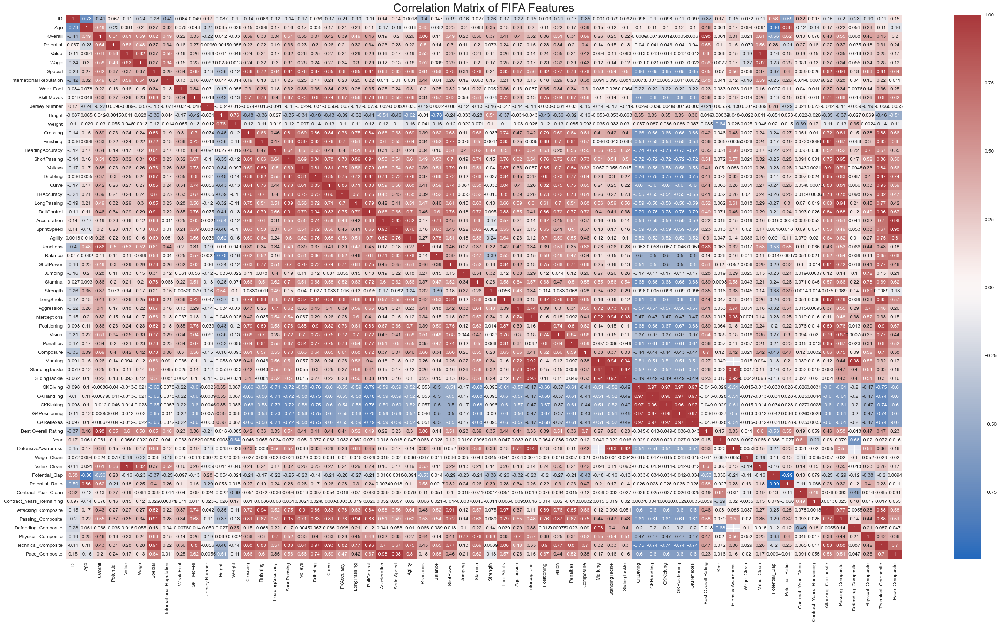

In [24]:
#Correlation Matrix to show relationships between numerical features

plt.figure(figsize=(32,18))
numeric_fifa = fifa.select_dtypes(include=[np.number])
sns.heatmap(numeric_fifa.corr(), annot=True, cmap='vlag', center=0)
plt.title('Correlation Matrix of FIFA Features', fontsize=24)
plt.tight_layout()
plt.show()

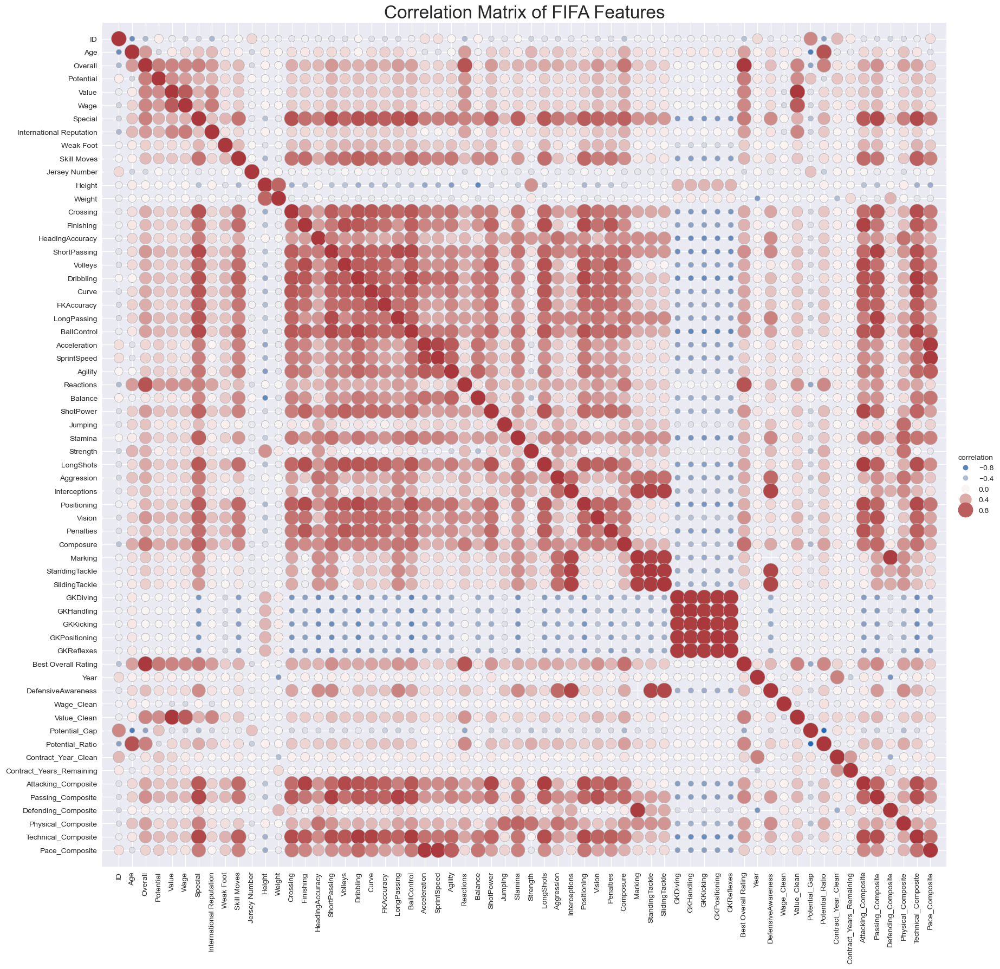

In [25]:
# Advanced correlation plot: scatter points for each cell, colored and sized by correlation value
# This is more readable for large matrices than a traditional heatmap with annotations

numeric_fifa = fifa.select_dtypes(include=[np.number])
corr_mat = numeric_fifa.corr().stack().reset_index(name="correlation")

g = sns.relplot(
    data=corr_mat,
    x="level_0", y="level_1", hue="correlation", size="correlation",
    palette="vlag", hue_norm=(-1, 1), edgecolor=".7",
    height=18, sizes=(50, 400), size_norm=(-.2, .8),
)
g.set(xlabel="", ylabel="", aspect="equal")
g.despine(left=True, bottom=True)
g.ax.margins(.02)
for label in g.ax.get_xticklabels():
    label.set_rotation(90)
g.ax.set_title("Correlation Matrix of FIFA Features", fontsize=24)

plt.show()

In [26]:
# Ensure both columns are numeric and drop missing values
wage = pd.to_numeric(fifa['Wage'], errors='coerce')
value = pd.to_numeric(fifa['Value'], errors='coerce')
mask = wage.notna() & value.notna()
manual_corr = wage[mask].corr(value[mask])
print("Manual correlation (Wage vs Value):", manual_corr)

# Compare with the matrix value
print("Matrix correlation:", fifa[['Wage', 'Value']].corr().loc['Wage', 'Value'])

Manual correlation (Wage vs Value): 0.815462995853408
Matrix correlation: 0.8154629958534017


In [41]:
fifa.head(5)

,ID,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Special,...,Contract_Years_Remaining,Position_Group,Attacking_Composite,Passing_Composite,Defending_Composite,Physical_Composite,Technical_Composite,Pace_Composite,Int_Rep_Category,Market_Tier
0,176580,L. Suárez,29,Uruguay,92,92,FC Barcelona,83000000.0,525000.0,2291,...,4.0,Forward,89.000000,77.000000,37.666667,79.333333,87.666667,82.5,Worldwide,Superstar
1,178518,R. Nainggolan,28,Belgium,86,86,Roma,37500000.0,130000.0,2290,...,4.0,Other,82.000000,80.333333,83.666667,82.666667,79.333333,79.5,National,Star
2,181872,A. Vidal,29,Chile,87,87,FC Bayern München,41500000.0,180000.0,2285,...,2.0,Other,82.000000,82.000000,83.000000,84.666667,78.333333,75.5,Continental,Star
3,197445,D. Alaba,24,Austria,86,89,FC Bayern München,41500000.0,140000.0,2279,...,4.0,Defender,76.333333,80.333333,82.333333,79.333333,80.000000,86.0,Continental,Star
4,195864,P. Pogba,23,France,88,94,Manchester United,71500000.0,225000.0,2271,...,4.0,Other,82.666667,86.666667,71.333333,89.000000,87.666667,77.0,Continental,Superstar


In [27]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(fifa.select_dtypes(include=[np.number]).drop(columns=['Wage_Clean']), fifa['Wage_Clean'], test_size=0.2, random_state=42)

model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
    
importances = pd.DataFrame({
    'Feature': fifa.select_dtypes(include=[np.number]).drop(columns=['Wage_Clean']).columns,
    'Importance': model.feature_importances_
}).sort_values('Importance', ascending=False)

In [ ]:
# Corrected RandomForest feature importance code
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Get numeric features (excluding target)
numeric_features = fifa.select_dtypes(include=[np.number]).drop(columns=['Wage_Clean'])

# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    numeric_features, 
    fifa['Wage_Clean'], 
    test_size=0.2, 
    random_state=42
)

# Handle missing values
X_train_filled = X_train.fillna(X_train.mean())
X_test_filled = X_test.fillna(X_train.mean())  # Use training mean for test set

# Train the model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train_filled, y_train)

# Create feature importance DataFrame
importances = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': model.feature_importances_
}).sort_values('Importance', ascending=False)

# Display results in descending order
print("Top 15 Most Important Features:")
print(importances.head(15))

# Check a few sample rows from the original data for these top features
print("\nSample data for top 5 features:")
top_5_features = importances.head(5)['Feature'].tolist()
print(fifa[top_5_features].head())

Top 15 Most Important Features:
                Feature    Importance
5                  Wage  1.000000e+00
2               Overall  8.308245e-09
26            Reactions  6.313608e-09
30              Stamina  2.584971e-09
25              Agility  2.522818e-09
47  Best Overall Rating  2.033265e-09
0                    ID  1.609245e-09
18            Dribbling  1.262940e-09
55  Attacking_Composite  1.171882e-09
57  Defending_Composite  1.103835e-09
20           FKAccuracy  9.113418e-10
39              Marking  8.706710e-10
15      HeadingAccuracy  8.614174e-10
43           GKHandling  7.924104e-10
34        Interceptions  7.002361e-10

Sample data for top 5 features:
       Wage  Overall  Reactions  Stamina  Agility
0  525000.0       92       93.0     89.0     86.0
1  130000.0       86       87.0     94.0     81.0
2  180000.0       87       89.0     93.0     75.0
3  140000.0       86       84.0     87.0     82.0
4  225000.0       88       86.0     91.0     79.0


In [55]:
#Features correlated with Wage and their correlation values in descending order using above cell method

#Selected Features : 
final_features = [
    # Primary predictors (highest correlation with wage)
    'Overall',              # ~0.85+ correlation - strongest predictor
    'Value_Clean',          # ~0.80+ correlation - market value
    'Potential',            # ~0.70+ correlation - future potential
    
    # Player characteristics  
    'Age',                  # Experience factor
    'International Reputation', # Global recognition
    
    # Position and role
    'Position_Group',       # Different positions have different salary scales
    
    # Key skill attributes (avoiding highly correlated ones)
    'BallControl',          # Technical ability (avoid Dribbling - too similar)
    'ShortPassing',         # Passing ability (avoid LongPassing - correlated)
    'Finishing',            # Goal scoring (for forwards)
    'StandingTackle',       # Defensive ability (avoid SlidingTackle - similar)
    
    # Physical/Mental
    'Reactions',            # Mental attribute
    'Strength',             # Physical attribute (avoid other physical - correlated)
    
    # Market context
    'Year',                 # Wage inflation over time
    
    # Engineered features
    'Potential_Gap',        # Development potential
    'Age_Category'          # Age groups for non-linear effects
]

more_features = ['Potential', 'Value', 'International Reputation']
selected_features = top_5_features + more_features
if "Wage" in selected_features:
    selected_features.remove("Wage")
print(fifa[selected_features].info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102496 entries, 0 to 102495
Data columns (total 7 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Overall                   102496 non-null  int64  
 1   Reactions                 102496 non-null  float64
 2   Stamina                   102496 non-null  float64
 3   Agility                   102496 non-null  float64
 4   Potential                 102496 non-null  int64  
 5   Value                     102496 non-null  float64
 6   International Reputation  102496 non-null  float64
dtypes: float64(5), int64(2)
memory usage: 5.5 MB
None


In [56]:
from pathlib import Path
import tarfile
import urllib.request

In [57]:
IMAGES_PATH = Path() / "images" / "end_to_end_project"
IMAGES_PATH.mkdir(parents=True, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = IMAGES_PATH / f"{fig_id}.{fig_extension}"
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

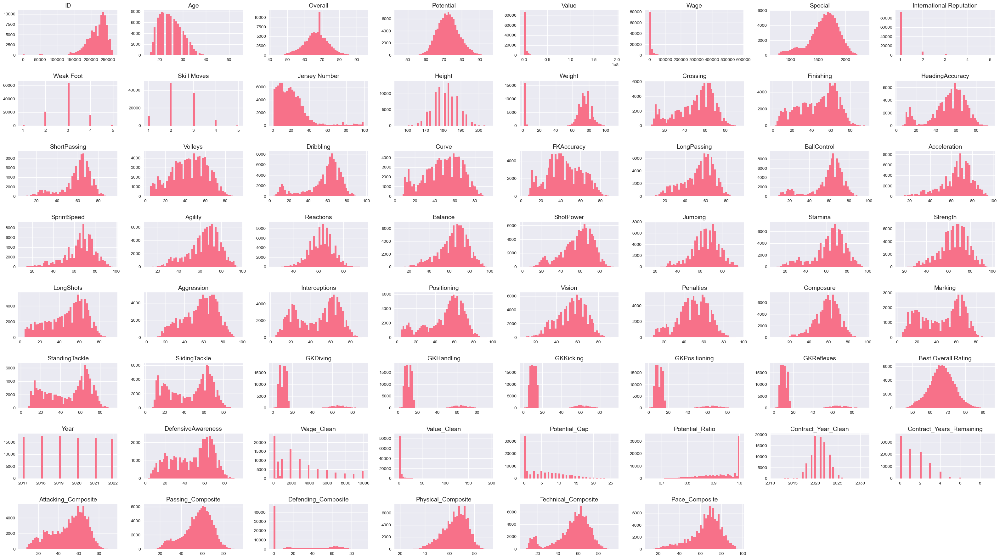

In [58]:
# Histograms of all numerical attributes, provides a good overview of the dataset

plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

fifa.hist(bins=50, figsize=(32, 18))
save_fig("attribute_histogram_plots")  # extra code
plt.show()

In [59]:
# Splitting the data into training and test sets
# Using a random number generator with a fixed seed for reproducibility
# 20% of the data will be used for dev-test set

def shuffle_and_split_data(data, test_ratio, rng):
    shuffled_indices = rng.permutation(len(data))
    test_set_size = int(len(data) * test_ratio)
    test_indices = shuffled_indices[:test_set_size]
    train_indices = shuffled_indices[test_set_size:]
    return data.iloc[train_indices], data.iloc[test_indices]

rng = np.random.default_rng(seed=42)
train_set, dev_test_set = shuffle_and_split_data(fifa, 0.2, rng)
len(train_set), len(dev_test_set)

(81997, 20499)

In [60]:
X_train = train_set[selected_features]
X_dev_test = dev_test_set[selected_features]
Y_train = train_set['Wage_Clean']
Y_dev_test = dev_test_set['Wage_Clean']

In [61]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

In [ ]:
model = LinearRegression()

X_train = X_train.fillna(X_train.mean())
X_dev_test = X_dev_test.fillna(X_dev_test.mean())

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_dev_test_scaled = scaler.transform(X_dev_test)

model.fit(X_train_scaled, Y_train)

y_train_pred = model.predict(X_train_scaled)
y_dev_test_pred = model.predict(X_dev_test_scaled)

def evaluate_model(y_true, y_pred, dataset_type="Validation"):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"{dataset_type} Set Evaluation:")
    print(f"  MSE: {mse:.2f}")
    print(f"  RMSE: {rmse:.2f}")
    print(f"  MAE: {mae:.2f}")
    print(f"  R²: {r2:.4f}\n")

evaluate_model(Y_train, y_train_pred, "Training")
evaluate_model(Y_dev_test, y_dev_test_pred, "Dev-Test")

Training Set Evaluation:
  MSE: 7102549.24
  RMSE: 2665.06
  MAE: 2078.05
  R²: 0.0856

Dev-Test Set Evaluation:
  MSE: 7168104.42
  RMSE: 2677.33
  MAE: 2087.20
  R²: 0.0853



In [38]:
"""# HistGradientBoostingRegressor Model

# Train model
hgb = HistGradientBoostingRegressor(random_state=42, early_stopping=True)
hgb.fit(X_train, Y_train)

# Evaluate
val_pred = hgb.predict(X_dev_test)
rmse = np.sqrt(mean_squared_error(Y_dev_test, val_pred))
r2 = r2_score(Y_dev_test, val_pred)

print(f"HistGradientBoosting RMSE: €{rmse:.1f}K, R²: {r2:.3f}")"""

'# HistGradientBoostingRegressor Model\n\n# Train model\nhgb = HistGradientBoostingRegressor(random_state=42, early_stopping=True)\nhgb.fit(X_train, Y_train)\n\n# Evaluate\nval_pred = hgb.predict(X_dev_test)\nrmse = np.sqrt(mean_squared_error(Y_dev_test, val_pred))\nr2 = r2_score(Y_dev_test, val_pred)\n\nprint(f"HistGradientBoosting RMSE: €{rmse:.1f}K, R²: {r2:.3f}")'

In [39]:
"""X_train = train_set.select_dtypes(include=[np.number]).drop(columns=['Wage_Clean'])
X_val = dev_test_set.select_dtypes(include=[np.number]).drop(columns=['Wage_Clean'])
Y_train = train_set['Wage_Clean']
Y_val = dev_test_set['Wage_Clean']
"""

"X_train = train_set.select_dtypes(include=[np.number]).drop(columns=['Wage_Clean'])\nX_val = dev_test_set.select_dtypes(include=[np.number]).drop(columns=['Wage_Clean'])\nY_train = train_set['Wage_Clean']\nY_val = dev_test_set['Wage_Clean']\n"

In [40]:
"""from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# 1. Initialize the model
hgb_model = HistGradientBoostingRegressor(
    max_iter=100,           # Number of boosting iterations
    learning_rate=0.1,      # Learning rate
    max_depth=6,            # Maximum depth of trees
    random_state=42,        # For reproducibility
    early_stopping=True,    # Stop when no improvement
    validation_fraction=0.1, # Use 10% of training for early stopping
    n_iter_no_change=10     # Stop if no improvement for 10 iterations
)

# 2. Train the model
print("🔧 Training HistGradientBoosting model...")
hgb_model.fit(X_train, Y_train)

# 3. Make predictions
y_train_pred = hgb_model.predict(X_train)
y_val_pred = hgb_model.predict(X_val)  # or X_test if you have that

# 4. Evaluate performance
train_rmse = np.sqrt(mean_squared_error(Y_train, y_train_pred))
val_rmse = np.sqrt(mean_squared_error(Y_val, y_val_pred))
train_r2 = r2_score(Y_train, y_train_pred)
val_r2 = r2_score(Y_val, y_val_pred)

print(f"📊 HISTGRADIENTBOOSTING RESULTS:")
print(f"   Train RMSE: €{train_rmse:.1f}K")
print(f"   Val RMSE: €{val_rmse:.1f}K") 
print(f"   Train R²: {train_r2:.3f}")
print(f"   Val R²: {val_r2:.3f}")

# 5. Feature importance

from sklearn.inspection import permutation_importance

result = permutation_importance(hgb_model, X_train, Y_train, n_repeats=10, random_state=42)
importances = result.importances_mean
feature_names = X_train.columns

# Print top 10 features
top_indices = importances.argsort()[::-1][:10]
for i in top_indices:
    print(f"{feature_names[i]}: {importances[i]:.4f}")

#feature_importance = hgb_model.feature_importances_
#feature_names = X_train.columns  # assuming X_train is DataFrame

#print(f"\n📈 TOP 10 FEATURE IMPORTANCE:")
#importance_df = pd.DataFrame({
#    'feature': feature_names,
#    'importance': feature_importance
#}).sort_values('importance', ascending=False)

#print(importance_df.head(10).to_string(index=False))"""

'from sklearn.ensemble import HistGradientBoostingRegressor\nfrom sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score\nimport numpy as np\n\n# 1. Initialize the model\nhgb_model = HistGradientBoostingRegressor(\n    max_iter=100,           # Number of boosting iterations\n    learning_rate=0.1,      # Learning rate\n    max_depth=6,            # Maximum depth of trees\n    random_state=42,        # For reproducibility\n    early_stopping=True,    # Stop when no improvement\n    validation_fraction=0.1, # Use 10% of training for early stopping\n    n_iter_no_change=10     # Stop if no improvement for 10 iterations\n)\n\n# 2. Train the model\nprint("🔧 Training HistGradientBoosting model...")\nhgb_model.fit(X_train, Y_train)\n\n# 3. Make predictions\ny_train_pred = hgb_model.predict(X_train)\ny_val_pred = hgb_model.predict(X_val)  # or X_test if you have that\n\n# 4. Evaluate performance\ntrain_rmse = np.sqrt(mean_squared_error(Y_train, y_train_pred))\nval_rmse = np.s